In [1]:
import pandas as pd
import librosa
import librosa.display
import os
import numpy as np
from sklearn.preprocessing import LabelEncoder, StandardScaler
from tensorflow.keras.utils import to_categorical
import tensorflow as tf
import matplotlib.pyplot as plt
from tensorflow.keras.models import Sequential
from sklearn.utils import shuffle
from matplotlib.pyplot import specgram

from tensorflow.keras.layers import Conv2D
from tensorflow.keras.layers import MaxPooling2D, GlobalMaxPooling2D
from tensorflow.keras.layers import Activation, Dropout
from tensorflow.keras.layers import BatchNormalization, InputLayer
from tensorflow.keras.layers import Flatten, Dense, LSTM, GRU
from tensorflow.keras.optimizers import RMSprop
from tensorflow.keras.optimizers import Adam
from sklearn.metrics import accuracy_score
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras.backend import clear_session
from tensorflow.keras.losses import SparseCategoricalCrossentropy
from tensorflow.keras.callbacks import ReduceLROnPlateau
%matplotlib inline

In [2]:
#train_fold = [1, 2, 3, 4, 6]
#test_fold = [5, 7, 8, 9, 10]
train_fold = [1, 2, 3, 4, 6, 5, 7, 8]
test_fold = [9, 10]

In [3]:
metadata = pd.read_csv('../dataset/UrbanSound8K/metadata/UrbanSound8K.csv')

In [4]:
metadata

,slice_file_name,fsID,start,end,salience,fold,classID,class
0,100032-3-0-0.wav,100032,0.000000,0.317551,1,5,3,dog_bark
1,100263-2-0-117.wav,100263,58.500000,62.500000,1,5,2,children_playing
2,100263-2-0-121.wav,100263,60.500000,64.500000,1,5,2,children_playing
3,100263-2-0-126.wav,100263,63.000000,67.000000,1,5,2,children_playing
4,100263-2-0-137.wav,100263,68.500000,72.500000,1,5,2,children_playing
...,...,...,...,...,...,...,...,...
8727,99812-1-2-0.wav,99812,159.522205,163.522205,2,7,1,car_horn
8728,99812-1-3-0.wav,99812,181.142431,183.284976,2,7,1,car_horn
8729,99812-1-4-0.wav,99812,242.691902,246.197885,2,7,1,car_horn
8730,99812-1-5-0.wav,99812,253.209850,255.741948,2,7,1,car_horn


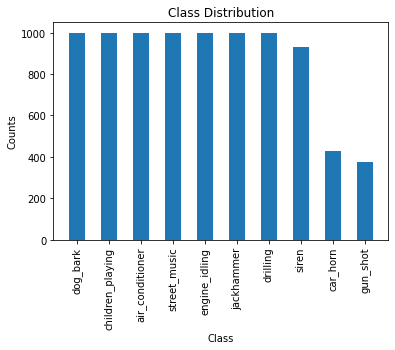

Class Distribution:
 dog_bark            1000
children_playing    1000
air_conditioner     1000
street_music        1000
engine_idling       1000
jackhammer          1000
drilling            1000
siren                929
car_horn             429
gun_shot             374
Name: class, dtype: int64


In [5]:
#Class Distribution
plt.bar(metadata['class'].value_counts().index, metadata['class'].value_counts(), width=0.5, bottom=None, align='center', data=metadata)
plt.title('Class Distribution')
plt.xticks(rotation='vertical')
plt.xlabel('Class')
plt.ylabel('Counts')
plt.show()
print('Class Distribution:\n',metadata['class'].value_counts())

In [6]:
#Extract features

features = []
for index, row in metadata.iterrows():
    
    file_name = os.path.join(os.path.abspath('../dataset/UrbanSound8K/audio/'), 'fold' + str(row["fold"]) + '/', str(row["slice_file_name"]))
    
    class_label = row["class"]
    fold = row["fold"]
    
    audio, sample_rate = librosa.load(file_name, res_type='kaiser_fast')
    normalized_audio = librosa.util.normalize(audio)
    
    mfcc = librosa.feature.mfcc(y = audio, sr = sample_rate, n_mfcc = 40)
    #normalized_mfcc = librosa.util.normalize(mfcc, axis=1)
    #scaler_mfcc = StandardScaler().fit_transform(mfcc)
    
    mels = librosa.feature.melspectrogram(y = audio, sr = sample_rate, n_mels = 40)
    mel_db = librosa.amplitude_to_db(abs(mels))
    #normalized_mel = librosa.util.normalize(mels, axis=1)
    #scaler_mel = StandardScaler().fit_transform(mel_db)
    #melspec = librosa.feature.melspectrogram(audio,n_mels=30)
    #logspec = librosa.amplitude_to_db(melspec)
    #logspec = logspec.T.flatten()[:, np.newaxis].T
    
    features.append([mfcc, mel_db, fold, class_label])
    #features.append([scaler_mfcc, scaler_mel, fold, class_label])

/Users/namnguyen/opt/anaconda3/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=2048 is too small for input signal of length=1323
  n_fft, y.shape[-1]
/Users/namnguyen/opt/anaconda3/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=2048 is too small for input signal of length=1103
  n_fft, y.shape[-1]
/Users/namnguyen/opt/anaconda3/lib/python3.7/site-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=2048 is too small for input signal of length=1523
  n_fft, y.shape[-1]


In [7]:
# Pre-process and extract feature from the data
#save_dir = "/Volumes/DATA/UNIMI/MachineLearning/dataset/UrbanSound8K/processed_nn/"
#np.savez("{0}{1}".format(save_dir, "features"), features = features)

In [8]:
#features = np.load("{0}{1}.npz".format(save_dir, "features"), allow_pickle=True)

In [9]:
features

[[array([[-3.06772552e+02, -1.77592087e+02, -9.91361618e+01,
          -6.59719772e+01, -4.92520256e+01, -5.95824699e+01,
          -1.07877678e+02, -1.67958786e+02, -2.22837250e+02,
          -2.73532562e+02, -3.20838074e+02, -3.58299469e+02,
          -3.91589081e+02, -4.19861816e+02],
         [ 1.27254486e+02,  9.50825653e+01,  7.42132721e+01,
           6.09353790e+01,  5.17881851e+01,  4.67519302e+01,
           4.29447594e+01,  4.60643959e+01,  5.43619537e+01,
           6.44584198e+01,  7.46726761e+01,  8.26809540e+01,
           8.79385071e+01,  9.41782455e+01],
         [-1.13722748e+02, -1.31244415e+02, -1.41885315e+02,
          -1.49715439e+02, -1.55917755e+02, -1.57878021e+02,
          -1.52023682e+02, -1.41128723e+02, -1.36091339e+02,
          -1.31354401e+02, -1.20596252e+02, -1.14046051e+02,
          -1.06593048e+02, -9.31955414e+01],
         [-4.60874710e+01, -5.06342468e+01, -6.17479019e+01,
          -6.66678391e+01, -6.35173569e+01, -6.25285568e+01,
          -

In [10]:
#convert into a dataframe
featuresdf = pd.DataFrame(features, columns=['mfcc', 'spectrogram', 'fold', 'class_label'])

In [11]:
featuresdf

,mfcc,spectrogram,fold,class_label
0,"[[-306.77255, -177.59209, -99.13616, -65.97198...","[[-34.411846, -34.411846, -34.411846, -34.4118...",5,dog_bark
1,"[[-457.69534, -451.0248, -450.68613, -445.0000...","[[-35.62088, -30.47674, -33.190228, -31.054619...",5,children_playing
2,"[[-468.0367, -467.42264, -481.04654, -486.5948...","[[-31.963863, -27.072693, -28.658297, -36.1155...",5,children_playing
3,"[[-422.42215, -411.9085, -409.46243, -409.0892...","[[-25.10336, -29.71753, -34.72935, -33.370255,...",5,children_playing
4,"[[-438.10162, -434.47787, -443.3284, -442.6643...","[[-28.925358, -28.532772, -30.23327, -32.06410...",5,children_playing
...,...,...,...,...
8727,"[[-397.82446, -400.45578, -407.5035, -408.9529...","[[-42.583694, -41.101624, -38.05232, -33.18789...",7,car_horn
8728,"[[-451.81265, -451.41983, -450.67892, -445.635...","[[-29.476376, -32.032803, -37.611263, -39.6909...",7,car_horn
8729,"[[-301.06348, -298.25397, -305.0326, -303.8614...","[[-23.606298, -24.976692, -28.179075, -20.4493...",7,car_horn
8730,"[[-373.6307, -369.44986, -366.48, -364.9094, -...","[[-32.765995, -28.439568, -26.08957, -28.48947...",7,car_horn


In [12]:
train_data = featuresdf.loc[featuresdf['fold'].isin(train_fold)]
test_data = featuresdf.loc[featuresdf['fold'].isin(test_fold)]

In [13]:
test_data.shape

(1653, 4)

In [14]:
def load_sound_files(file_paths):
    raw_sounds = []
    for fp in file_paths:
        X,sr = librosa.load(fp, res_type='kaiser_fast')
        raw_sounds.append(X)
    return raw_sounds

def plot_mfcc(sound_names, raw_sounds):
    #i = 1
    fig = plt.figure(figsize=(25,60), dpi = 900)
    for n, f in zip(sound_names,raw_sounds):
        mfcc = librosa.feature.mfcc(y = f, sr = 22050, n_mfcc = 40)
        librosa.display.specshow(mfcc, x_axis='time')
        plt.colorbar()
        plt.title(n.title())
        plt.show()

def plot_mel(sound_names, raw_sounds):
    #i = 1
    fig = plt.figure(figsize=(25,60), dpi = 900)
    for n, f in zip(sound_names,raw_sounds):
        melspectrogram = librosa.feature.melspectrogram(y=f, sr=22050, n_mels=40)
        librosa.display.specshow(librosa.power_to_db(melspectrogram,ref=np.max),y_axis='mel', fmax=8000,x_axis='time')
        plt.colorbar(format='%+2.0f dB')
        plt.title(n.title())
        plt.show()

In [15]:
### Plot few sound clips along with their spectrograms ###
sound_file_paths = ["/Volumes/DATA/UNIMI/MachineLearning/dataset/UrbanSound8K/audio/fold1/134717-0-0-23.wav", "/Volumes/DATA/UNIMI/MachineLearning/dataset/UrbanSound8K/audio/fold1/134717-0-0-23.wav", "/Volumes/DATA/UNIMI/MachineLearning/dataset/UrbanSound8K/audio/fold1/162540-1-0-0.wav",
                    "/Volumes/DATA/UNIMI/MachineLearning/dataset/UrbanSound8K/audio/fold1/135776-2-0-50.wav","/Volumes/DATA/UNIMI/MachineLearning/dataset/UrbanSound8K/audio/fold1/203356-3-0-0.wav",
                    "/Volumes/DATA/UNIMI/MachineLearning/dataset/UrbanSound8K/audio/fold1/147764-4-4-1.wav","/Volumes/DATA/UNIMI/MachineLearning/dataset/UrbanSound8K/audio/fold1/103258-5-0-0.wav",
                    "/Volumes/DATA/UNIMI/MachineLearning/dataset/UrbanSound8K/audio/fold1/7061-6-0-0.wav","/Volumes/DATA/UNIMI/MachineLearning/dataset/UrbanSound8K/audio/fold1/180937-7-1-0.wav",
                    "/Volumes/DATA/UNIMI/MachineLearning/dataset/UrbanSound8K/audio/fold1/106905-8-0-0.wav","/Volumes/DATA/UNIMI/MachineLearning/dataset/UrbanSound8K/audio/fold1/108041-9-0-2.wav"]
sound_names = ["air conditioner", "air conditioner","car horn","children playing",
               "dog bark","drilling","engine idling",
               "gun shot","jackhammer","siren","street music"]
plt.rcParams['agg.path.chunksize'] = 10000

In [16]:
raw_sounds = load_sound_files(sound_file_paths)

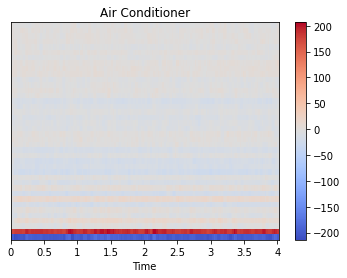

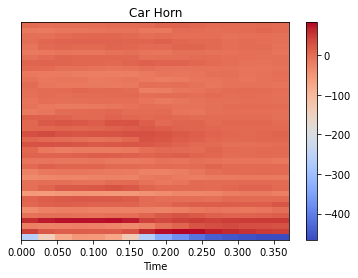

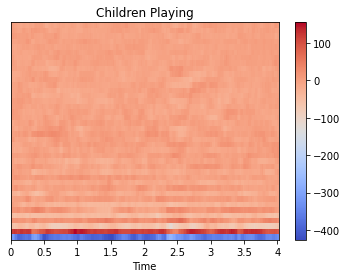

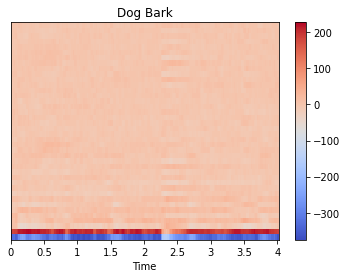

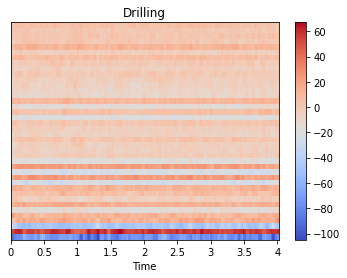

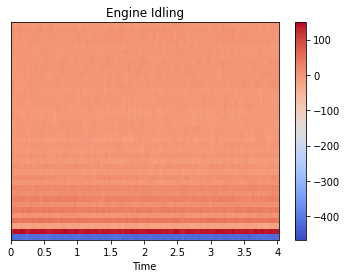

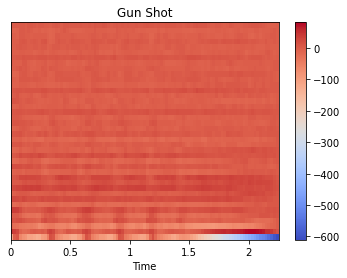

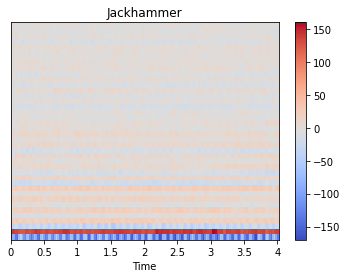

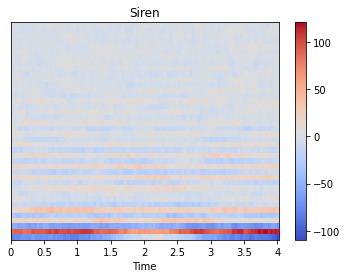

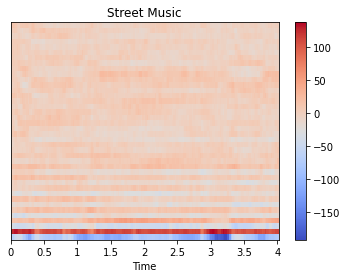

In [17]:
plot_mfcc(sound_names,raw_sounds)

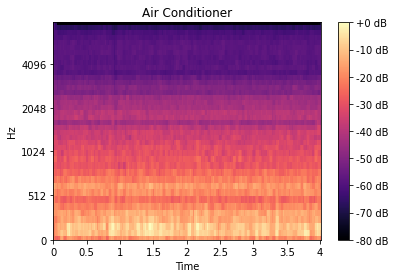

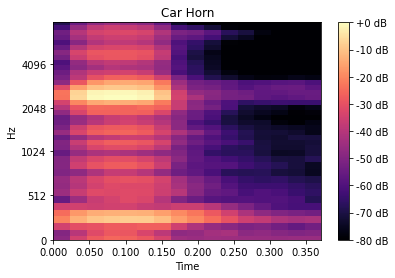

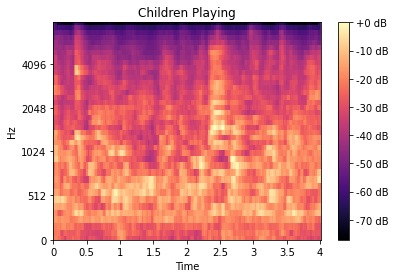

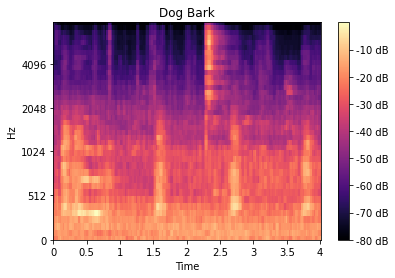

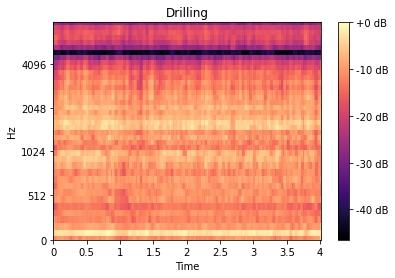

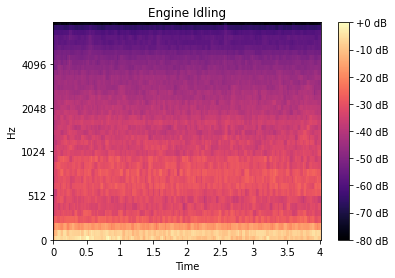

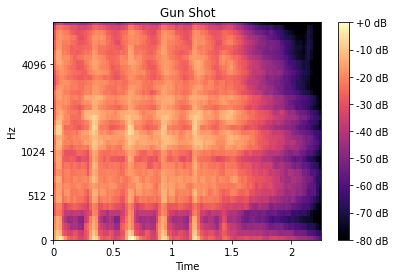

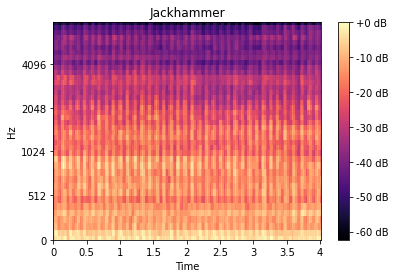

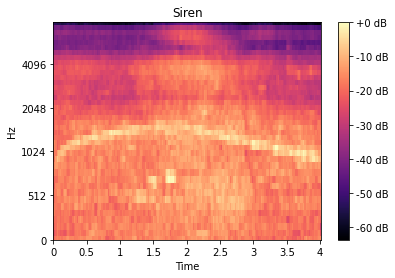

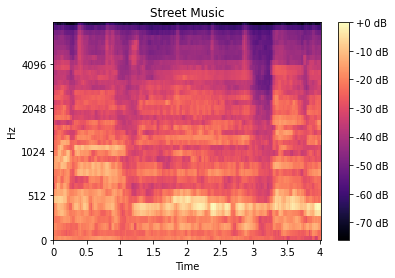

In [18]:
plot_mel(sound_names,raw_sounds)

In [19]:
def add_padding(features, max_len):
    X = [pad_sequences(x, maxlen = max_len, padding="post", truncating= "post") for x in features]
    X_norm = [StandardScaler().fit_transform(x) for x in X]
    return np.array(X_norm)

In [20]:
pad_size = 174

In [21]:
encoder = LabelEncoder()

X_train_mfcc = add_padding(train_data['mfcc'], pad_size)
#X_train_mfcc = StandardScaler().fit_transform(X_train_mfcc)
y_train_mfcc = to_categorical(encoder.fit_transform(train_data['class_label']))

X_test_mfcc = add_padding(test_data['mfcc'], pad_size)
#X_test_mfcc = StandardScaler().fit_transform(X_test_mfcc)
y_test_mfcc = to_categorical(encoder.fit_transform(test_data['class_label']))

X_train_spectrogram = add_padding(train_data['spectrogram'], pad_size)
#X_train_spectrogram = StandardScaler().fit_transform(X_train_spectrogram)
y_train_spectrogram = to_categorical(encoder.fit_transform(train_data['class_label']))

X_test_spectrogram = add_padding(test_data['spectrogram'], pad_size)
#X_test_spectrogram = StandardScaler().fit_transform(X_test_spectrogram)
y_test_spectrogram = to_categorical(encoder.fit_transform(test_data['class_label']))

In [22]:
X_train_mfcc.shape, y_train_mfcc.shape

((7079, 40, 174), (7079, 10))

In [23]:
X_train_spectrogram.shape, y_train_spectrogram.shape

((7079, 40, 174), (7079, 10))

In [24]:
X_test_mfcc.shape, y_test_mfcc.shape

((1653, 40, 174), (1653, 10))

In [25]:
X_test_spectrogram.shape, y_test_spectrogram.shape

((1653, 40, 174), (1653, 10))

In [26]:
train_data['mfcc']

0       [[-306.77255, -177.59209, -99.13616, -65.97198...
1       [[-457.69534, -451.0248, -450.68613, -445.0000...
2       [[-468.0367, -467.42264, -481.04654, -486.5948...
3       [[-422.42215, -411.9085, -409.46243, -409.0892...
4       [[-438.10162, -434.47787, -443.3284, -442.6643...
                              ...                        
8727    [[-397.82446, -400.45578, -407.5035, -408.9529...
8728    [[-451.81265, -451.41983, -450.67892, -445.635...
8729    [[-301.06348, -298.25397, -305.0326, -303.8614...
8730    [[-373.6307, -369.44986, -366.48, -364.9094, -...
8731    [[-309.34647, -305.3132, -308.23593, -308.1856...
Name: mfcc, Length: 7079, dtype: object

In [27]:
encoder.fit_transform(train_data['class_label'])

array([3, 2, 2, ..., 1, 1, 1])

In [28]:
X_train_mfcc_clf = X_train_mfcc.reshape(X_train_mfcc.shape[0], -1)

In [29]:
X_test_mfcc_clf = X_test_mfcc.reshape(X_test_mfcc.shape[0], -1)

In [30]:
X_test_mfcc_clf.shape

(1653, 6960)

In [31]:
#from sklearn.ensemble import GradientBoostingClassifier

In [32]:
#clf = GradientBoostingClassifier(n_estimators = 100, learning_rate=1.0, max_depth = 1, random_state = 40)

In [33]:
#clf.fit(X_train_mfcc_clf, encoder.fit_transform(train_data['class_label']))
#clf_pred = clf.predict(X_test_mfcc_clf)
#accuracy_score(encoder.fit_transform(test_data['class_label']), clf_pred)

In [34]:
#from sklearn.ensemble import RandomForestClassifier

In [35]:
#rf = RandomForestClassifier(max_depth=80, random_state=0)

In [36]:
#rf.fit(X_train_mfcc_clf, encoder.fit_transform(train_data['class_label']))

In [37]:
#rf_pred = rf.predict(X_test_mfcc_clf)
#accuracy_score(encoder.fit_transform(test_data['class_label']), rf_pred)

In [38]:
X_train_mfcc.shape

(7079, 40, 174)

In [39]:
len(X_train_spectrogram)

7079

In [40]:
#X_train_spectrogram = np.asarray(X_train_spectrogram).reshape(len(X_train_spectrogram),30,41,1)

In [41]:
num_rows = 40
num_columns = pad_size
num_channels = 1
num_labels = 10

In [42]:
X_train_mfcc = X_train_mfcc.reshape(X_train_mfcc.shape[0], num_rows, num_columns, num_channels)
X_test_mfcc = X_test_mfcc.reshape(X_test_mfcc.shape[0], num_rows, num_columns, num_channels)

X_train_spectrogram = X_train_spectrogram.reshape(X_train_spectrogram.shape[0], num_rows, num_columns, num_channels)
X_test_spectrogram = X_test_spectrogram.reshape(X_test_spectrogram.shape[0], num_rows, num_columns, num_channels)

In [43]:
X_train_mfcc.shape

(7079, 40, 174, 1)

In [44]:
X_train_spectrogram.shape

(7079, 40, 174, 1)

In [45]:
def predict_test_fold(model, feature):
    e = LabelEncoder()
    acc = []
    for f in test_fold:
        fold = featuresdf.loc[featuresdf['fold'] == f]
        if feature == "mfcc":
            X_test = add_padding(fold['mfcc'], pad_size)
            X_test = X_test.reshape(X_test.shape[0], num_rows, num_columns, num_channels)
            y_test = to_categorical(e.fit_transform(fold['class_label']))
        elif feature == "spectrogram":
            X_test = add_padding(fold['spectrogram'], pad_size)
            X_test = X_test.reshape(X_test.shape[0], num_rows, num_columns, num_channels)
            y_test = to_categorical(e.fit_transform(fold['class_label']))
        elif feature == "sce":
            X_test = add_padding(fold['mfcc'], pad_size)
            X_test = X_test.reshape(X_test.shape[0], num_rows, num_columns, num_channels)
            y_test = e.fit_transform(fold['class_label'])
        elif feature == "rnn_mfcc":
            X_test = add_padding(fold['mfcc'], pad_size)
            X_test = X_test.reshape(X_test.shape[0], num_rows, num_columns)
            y_test = e.fit_transform(fold['class_label'])
        elif feature == "rnn_spectrogram":
            X_test = add_padding(fold['spectrogram'], pad_size)
            X_test = X_test.reshape(X_test.shape[0], num_rows, num_columns)
            y_test = e.fit_transform(fold['class_label'])
        y_pred = model.predict(X_test)
        y_hat = []
        y_true = []
        for i in range(len(y_pred)):
            y_hat.append(np.argmax(y_pred[i]))
            y_true.append(np.argmax(y_test[i]))

        a = accuracy_score(y_true, y_hat)
        acc.append(a)
    std = np.std(acc)
    mean = np.mean(acc)
    return mean, std, acc

### RNN

In [46]:
model_rnn = Sequential()
model_rnn.add(LSTM(128, input_shape=(num_rows, num_columns), return_sequences=True))
model_rnn.add(Dropout(0.2))
model_rnn.add(Dense(128, activation='relu'))
model_rnn.add(Dense(64, activation='relu'))
model_rnn.add(Dropout(0.2))
model_rnn.add(Dense(48, activation='relu'))
model_rnn.add(Dropout(0.2))
model_rnn.add(Flatten())
model_rnn.add(Dense(10, activation='softmax'))
model_rnn.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm (LSTM)                  (None, 40, 128)           155136    
_________________________________________________________________
dropout (Dropout)            (None, 40, 128)           0         
_________________________________________________________________
dense (Dense)                (None, 40, 128)           16512     
_________________________________________________________________
dense_1 (Dense)              (None, 40, 64)            8256      
_________________________________________________________________
dropout_1 (Dropout)          (None, 40, 64)            0         
_________________________________________________________________
dense_2 (Dense)              (None, 40, 48)            3120      
_________________________________________________________________
dropout_2 (Dropout)          (None, 40, 48)            0

In [47]:
model_rnn.compile(optimizer = Adam(1e-4), metrics=["accuracy"], loss = "categorical_crossentropy")

In [48]:
rnn_mfcc_result = model_rnn.fit(X_train_mfcc.reshape(X_train_mfcc.shape[0], 40, 174), 
              y_train_mfcc, epochs = 20, batch_size = 24, validation_split = 0.2)

Train on 5663 samples, validate on 1416 samples
Epoch 1/20
5640/5663 [============================>.] - ETA: 0s - loss: 2.0422 - acc: 0.2436

/Users/namnguyen/opt/anaconda3/lib/python3.7/site-packages/tensorflow/python/keras/engine/training.py:2426: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  warnings.warn('`Model.state_updates` will be removed in a future version. '


5663/5663 [==============================] - 7s 1ms/sample - loss: 2.0414 - acc: 0.2437 - val_loss: 2.0051 - val_acc: 0.3340
Epoch 2/20
5663/5663 [==============================] - 7s 1ms/sample - loss: 1.6506 - acc: 0.3989 - val_loss: 1.7992 - val_acc: 0.3806
Epoch 3/20
5663/5663 [==============================] - 8s 1ms/sample - loss: 1.4556 - acc: 0.4683 - val_loss: 1.6965 - val_acc: 0.4068
Epoch 4/20
5663/5663 [==============================] - 7s 1ms/sample - loss: 1.3317 - acc: 0.5177 - val_loss: 1.7458 - val_acc: 0.4195
Epoch 5/20
5663/5663 [==============================] - 7s 1ms/sample - loss: 1.2325 - acc: 0.5566 - val_loss: 1.7308 - val_acc: 0.4244
Epoch 6/20
5663/5663 [==============================] - 7s 1ms/sample - loss: 1.1645 - acc: 0.5799 - val_loss: 1.7521 - val_acc: 0.4301
Epoch 7/20
5663/5663 [==============================] - 7s 1ms/sample - loss: 1.0908 - acc: 0.6089 - val_loss: 1.8327 - val_acc: 0.4145
Epoch 8/20
5663/5663 [==============================] - 7s 

In [49]:
mean, std, acc = predict_test_fold(model_rnn, 'rnn_mfcc')

/Users/namnguyen/opt/anaconda3/lib/python3.7/site-packages/tensorflow/python/keras/engine/training.py:2426: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  warnings.warn('`Model.state_updates` will be removed in a future version. '


In [50]:
mean, std, acc

(0.09772735258978144,
 0.02174696043291869,
 [0.07598039215686274, 0.11947431302270012])

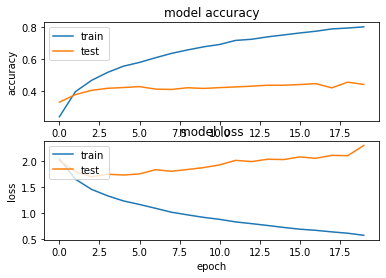

In [51]:
plt.figure(1)  
   
   
plt.subplot(211)  
plt.plot(rnn_mfcc_result.history['acc'])  
plt.plot(rnn_mfcc_result.history['val_acc'])  
plt.title('model accuracy')  
plt.ylabel('accuracy')  
plt.xlabel('epoch')  
plt.legend(['train', 'test'], loc='upper left')  
   
   
plt.subplot(212)  
plt.plot(rnn_mfcc_result.history['loss'])  
plt.plot(rnn_mfcc_result.history['val_loss'])  
plt.title('model loss')  
plt.ylabel('loss')  
plt.xlabel('epoch')  
plt.legend(['train', 'test'], loc='upper left')  
plt.show()

In [52]:
rnn_spectrogram_result = model_rnn.fit(X_train_spectrogram.reshape(X_train_spectrogram.shape[0], 40, 174), 
              y_train_spectrogram, epochs = 20, batch_size = 24, validation_split = 0.2)

Train on 5663 samples, validate on 1416 samples
Epoch 1/20
5663/5663 [==============================] - 7s 1ms/sample - loss: 2.2163 - acc: 0.2870 - val_loss: 2.0443 - val_acc: 0.2832
Epoch 2/20
5663/5663 [==============================] - 7s 1ms/sample - loss: 1.5660 - acc: 0.4190 - val_loss: 1.8929 - val_acc: 0.3277
Epoch 3/20
5663/5663 [==============================] - 7s 1ms/sample - loss: 1.3591 - acc: 0.4985 - val_loss: 1.7830 - val_acc: 0.3884
Epoch 4/20
5663/5663 [==============================] - 7s 1ms/sample - loss: 1.2341 - acc: 0.5502 - val_loss: 1.6751 - val_acc: 0.3842
Epoch 5/20
5663/5663 [==============================] - 7s 1ms/sample - loss: 1.1351 - acc: 0.5852 - val_loss: 1.5904 - val_acc: 0.4209
Epoch 6/20
5663/5663 [==============================] - 7s 1ms/sample - loss: 1.0651 - acc: 0.6188 - val_loss: 1.6611 - val_acc: 0.4124
Epoch 7/20
5663/5663 [==============================] - 8s 1ms/sample - loss: 1.0163 - acc: 0.6343 - val_loss: 1.5654 - val_acc: 0.4343


In [53]:
mean, std, acc = predict_test_fold(model_rnn, 'rnn_spectrogram')

In [54]:
mean, std, acc

(0.10336504673554009,
 0.006551321245344015,
 [0.09681372549019608, 0.10991636798088411])

### CNN

In [55]:
model_cnn=Sequential()
    
model_cnn.add(Conv2D(16,(3,3),activation='relu',input_shape=(num_rows, num_columns, num_channels)))
model_cnn.add(MaxPooling2D(2,2))
model_cnn.add(Dropout(0.2))
model_cnn.add(Conv2D(32,(3,3),activation='relu'))
model_cnn.add(MaxPooling2D(2,2))
model_cnn.add(Dropout(0.2))
model_cnn.add(Conv2D(64,(3,3),activation='relu'))
model_cnn.add(MaxPooling2D(2,2))
model_cnn.add(Dropout(0.2))
model_cnn.add(Conv2D(128,(3,3),activation='relu',padding='same'))
model_cnn.add(MaxPooling2D(2,2))
model_cnn.add(Dropout(0.4))
    
model_cnn.add(Flatten())
model_cnn.add(Dense(256,activation='relu'))
model_cnn.add(Dropout(0.5))
model_cnn.add(Dense(256,activation='relu'))
model_cnn.add(Dropout(0.5))
    
model_cnn.add(Dense(10,activation='softmax'))

model_cnn.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 38, 172, 16)       160       
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 19, 86, 16)        0         
_________________________________________________________________
dropout_3 (Dropout)          (None, 19, 86, 16)        0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 17, 84, 32)        4640      
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 8, 42, 32)         0         
_________________________________________________________________
dropout_4 (Dropout)          (None, 8, 42, 32)         0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 6, 40, 64)        

In [56]:
reduce = tf.keras.callbacks.ReduceLROnPlateau(monitor='loss', factor=0.1, patience=10, mode='auto')
model_cnn.compile(optimizer=Adam(1e-4), metrics=["accuracy"], loss = "categorical_crossentropy")
cnn_mfcc_result = model_cnn.fit(X_train_mfcc, y_train_mfcc, epochs = 20, batch_size = 24, callbacks=[reduce], validation_split=0.2)

Train on 5663 samples, validate on 1416 samples
Epoch 1/20
5663/5663 [==============================] - ETA: 0s - loss: 2.2301 - acc: 0.1505

/Users/namnguyen/opt/anaconda3/lib/python3.7/site-packages/tensorflow/python/keras/engine/training.py:2426: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  warnings.warn('`Model.state_updates` will be removed in a future version. '


5663/5663 [==============================] - 19s 3ms/sample - loss: 2.2301 - acc: 0.1505 - val_loss: 2.2442 - val_acc: 0.2189 - lr: 1.0000e-04
Epoch 2/20
5663/5663 [==============================] - 18s 3ms/sample - loss: 2.0568 - acc: 0.2190 - val_loss: 2.0757 - val_acc: 0.2775 - lr: 1.0000e-04
Epoch 3/20
5663/5663 [==============================] - 19s 3ms/sample - loss: 1.8545 - acc: 0.3020 - val_loss: 1.9362 - val_acc: 0.3129 - lr: 1.0000e-04
Epoch 4/20
5663/5663 [==============================] - 19s 3ms/sample - loss: 1.7232 - acc: 0.3526 - val_loss: 1.8884 - val_acc: 0.3510 - lr: 1.0000e-04
Epoch 5/20
5663/5663 [==============================] - 19s 3ms/sample - loss: 1.6268 - acc: 0.3977 - val_loss: 1.8351 - val_acc: 0.3715 - lr: 1.0000e-04
Epoch 6/20
5663/5663 [==============================] - 20s 4ms/sample - loss: 1.5467 - acc: 0.4289 - val_loss: 1.7946 - val_acc: 0.3665 - lr: 1.0000e-04
Epoch 7/20
5663/5663 [==============================] - 20s 3ms/sample - loss: 1.4558 -

In [57]:
mean, std, acc = predict_test_fold(model_cnn, 'mfcc')

/Users/namnguyen/opt/anaconda3/lib/python3.7/site-packages/tensorflow/python/keras/engine/training.py:2426: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  warnings.warn('`Model.state_updates` will be removed in a future version. '


In [58]:
mean, std, acc

(0.6339781432286176,
 0.0016252020521470567,
 [0.6323529411764706, 0.6356033452807647])

In [59]:
cnn_spectrogram_result = model_cnn.fit(X_train_spectrogram, y_train_spectrogram, epochs = 20, batch_size = 24, callbacks=[reduce], validation_split=0.2)

Train on 5663 samples, validate on 1416 samples
Epoch 1/20
5663/5663 [==============================] - 19s 3ms/sample - loss: 1.9301 - acc: 0.3440 - val_loss: 1.8190 - val_acc: 0.3305 - lr: 1.0000e-04
Epoch 2/20
5663/5663 [==============================] - 20s 4ms/sample - loss: 1.5772 - acc: 0.4219 - val_loss: 1.7325 - val_acc: 0.3637 - lr: 1.0000e-04
Epoch 3/20
5663/5663 [==============================] - 20s 3ms/sample - loss: 1.4490 - acc: 0.4845 - val_loss: 1.7375 - val_acc: 0.3806 - lr: 1.0000e-04
Epoch 4/20
5663/5663 [==============================] - 20s 4ms/sample - loss: 1.3470 - acc: 0.5202 - val_loss: 1.6792 - val_acc: 0.3955 - lr: 1.0000e-04
Epoch 5/20
5663/5663 [==============================] - 20s 4ms/sample - loss: 1.2588 - acc: 0.5520 - val_loss: 1.6384 - val_acc: 0.4174 - lr: 1.0000e-04
Epoch 6/20
5663/5663 [==============================] - 20s 3ms/sample - loss: 1.1787 - acc: 0.5829 - val_loss: 1.6294 - val_acc: 0.4407 - lr: 1.0000e-04
Epoch 7/20
5663/5663 [======

In [60]:
mean, std, acc = predict_test_fold(model_cnn, 'spectrogram')

In [61]:
mean, std, acc

(0.5888370581207394,
 0.016555098742005725,
 [0.6053921568627451, 0.5722819593787336])

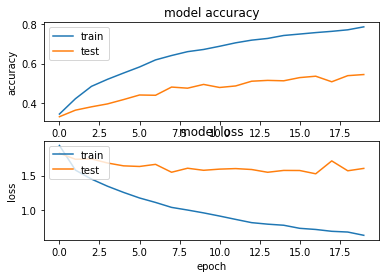

In [62]:
plt.figure(1)  
   
   
plt.subplot(211)  
plt.plot(cnn_spectrogram_result.history['acc'])  
plt.plot(cnn_spectrogram_result.history['val_acc'])  
plt.title('model accuracy')  
plt.ylabel('accuracy')  
plt.xlabel('epoch')  
plt.legend(['train', 'test'], loc='upper left')  
   
   
plt.subplot(212)  
plt.plot(cnn_spectrogram_result.history['loss'])  
plt.plot(cnn_spectrogram_result.history['val_loss'])  
plt.title('model loss')  
plt.ylabel('loss')  
plt.xlabel('epoch')  
plt.legend(['train', 'test'], loc='upper left')  
plt.show()

### LeNet-5

In [63]:
lenet_model_mfcc = Sequential()
lenet_model_mfcc.add(Conv2D(32, (3, 3), activation = "tanh", strides=(1, 1), input_shape = (num_rows, num_columns, num_channels), padding = "same"))

lenet_model_mfcc.add(MaxPooling2D(2, 2))
lenet_model_mfcc.add(Conv2D(32, (3, 3), strides=(1, 1),  activation = "tanh", padding = 'valid'))

lenet_model_mfcc.add(MaxPooling2D(2, 2))
lenet_model_mfcc.add(Conv2D(64, (3, 3), strides=(1, 1),  activation = "tanh", padding = 'valid'))
lenet_model_mfcc.add(MaxPooling2D(2, 2))
lenet_model_mfcc.add(Flatten())
lenet_model_mfcc.add(Dense(512, activation = "tanh"))
lenet_model_mfcc.add(Dropout(0.5))
lenet_model_mfcc.add(Dense(10, activation = "softmax"))

In [64]:
lenet_model_mfcc.summary()

Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_4 (Conv2D)            (None, 40, 174, 32)       320       
_________________________________________________________________
max_pooling2d_4 (MaxPooling2 (None, 20, 87, 32)        0         
_________________________________________________________________
conv2d_5 (Conv2D)            (None, 18, 85, 32)        9248      
_________________________________________________________________
max_pooling2d_5 (MaxPooling2 (None, 9, 42, 32)         0         
_________________________________________________________________
conv2d_6 (Conv2D)            (None, 7, 40, 64)         18496     
_________________________________________________________________
max_pooling2d_6 (MaxPooling2 (None, 3, 20, 64)         0         
_________________________________________________________________
flatten_2 (Flatten)          (None, 3840)             

In [65]:
lenet_model_mfcc.compile(loss = "categorical_crossentropy", optimizer = Adam(1e-4), metrics = ["acc"])
lenet_model_mfcc_result = lenet_model_mfcc.fit(X_train_mfcc, y_train_mfcc, epochs = 20, batch_size = 24,
                               validation_split = 0.2)

Train on 5663 samples, validate on 1416 samples
Epoch 1/20
5663/5663 [==============================] - ETA: 0s - loss: 1.6238 - acc: 0.4178

/Users/namnguyen/opt/anaconda3/lib/python3.7/site-packages/tensorflow/python/keras/engine/training.py:2426: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  warnings.warn('`Model.state_updates` will be removed in a future version. '


5663/5663 [==============================] - 23s 4ms/sample - loss: 1.6238 - acc: 0.4178 - val_loss: 1.7321 - val_acc: 0.4089
Epoch 2/20
5663/5663 [==============================] - 24s 4ms/sample - loss: 1.1589 - acc: 0.6147 - val_loss: 1.5925 - val_acc: 0.4555
Epoch 3/20
5663/5663 [==============================] - 24s 4ms/sample - loss: 0.9714 - acc: 0.6843 - val_loss: 1.6061 - val_acc: 0.4407
Epoch 4/20
5663/5663 [==============================] - 23s 4ms/sample - loss: 0.8155 - acc: 0.7387 - val_loss: 1.5625 - val_acc: 0.4845
Epoch 5/20
5663/5663 [==============================] - 23s 4ms/sample - loss: 0.7054 - acc: 0.7791 - val_loss: 1.5856 - val_acc: 0.4880
Epoch 6/20
5663/5663 [==============================] - 23s 4ms/sample - loss: 0.6125 - acc: 0.8158 - val_loss: 1.5247 - val_acc: 0.5184
Epoch 7/20
5663/5663 [==============================] - 24s 4ms/sample - loss: 0.5447 - acc: 0.8347 - val_loss: 1.6376 - val_acc: 0.5042
Epoch 8/20
5663/5663 [==============================

In [66]:
mean, std, acc = predict_test_fold(lenet_model_mfcc, 'mfcc')

/Users/namnguyen/opt/anaconda3/lib/python3.7/site-packages/tensorflow/python/keras/engine/training.py:2426: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  warnings.warn('`Model.state_updates` will be removed in a future version. '


In [67]:
mean, std, acc

(0.6664975578044838,
 0.013311283294679899,
 [0.6531862745098039, 0.6798088410991637])

In [68]:
lenet_model_mels = Sequential()
lenet_model_mels.add(Conv2D(32, (3, 3), activation = "relu", strides=(1, 1), input_shape = (num_rows, num_columns, num_channels), padding = "same"))
lenet_model_mels.add(MaxPooling2D(2, 2))
lenet_model_mels.add(Conv2D(32, (3, 3), strides=(1, 1),  activation = "relu", padding = 'valid'))
lenet_model_mels.add(MaxPooling2D(2, 2))
lenet_model_mels.add(Conv2D(64, (3, 3), strides=(1, 1),  activation = "relu", padding = 'valid'))
lenet_model_mels.add(MaxPooling2D(2, 2))
lenet_model_mels.add(Flatten())
lenet_model_mels.add(Dense(512, activation = "relu"))
lenet_model_mels.add(Dropout(0.5))
lenet_model_mels.add(Dense(10, activation = "softmax"))

In [69]:
lenet_model_mels.compile(loss = "categorical_crossentropy", optimizer = Adam(1e-4), metrics = ["acc"])
lenet_model_mels_result = lenet_model_mels.fit(X_train_spectrogram, y_train_spectrogram, epochs = 20, batch_size = 24,
                               validation_split = 0.2)

Train on 5663 samples, validate on 1416 samples
Epoch 1/20
5663/5663 [==============================] - ETA: 0s - loss: 1.7516 - acc: 0.3556

/Users/namnguyen/opt/anaconda3/lib/python3.7/site-packages/tensorflow/python/keras/engine/training.py:2426: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  warnings.warn('`Model.state_updates` will be removed in a future version. '


5663/5663 [==============================] - 21s 4ms/sample - loss: 1.7516 - acc: 0.3556 - val_loss: 1.8417 - val_acc: 0.3404
Epoch 2/20
5663/5663 [==============================] - 21s 4ms/sample - loss: 1.3374 - acc: 0.5216 - val_loss: 1.8075 - val_acc: 0.3905
Epoch 3/20
5663/5663 [==============================] - 21s 4ms/sample - loss: 1.1202 - acc: 0.6057 - val_loss: 1.6991 - val_acc: 0.4287
Epoch 4/20
5663/5663 [==============================] - 21s 4ms/sample - loss: 0.9683 - acc: 0.6754 - val_loss: 1.7175 - val_acc: 0.4605
Epoch 5/20
5663/5663 [==============================] - 21s 4ms/sample - loss: 0.8426 - acc: 0.7191 - val_loss: 1.7402 - val_acc: 0.4428
Epoch 6/20
5663/5663 [==============================] - 21s 4ms/sample - loss: 0.7391 - acc: 0.7588 - val_loss: 1.7884 - val_acc: 0.4732
Epoch 7/20
5663/5663 [==============================] - 21s 4ms/sample - loss: 0.6713 - acc: 0.7876 - val_loss: 1.7372 - val_acc: 0.4781
Epoch 8/20
5663/5663 [==============================

In [70]:
mean, std, acc = predict_test_fold(lenet_model_mels, 'spectrogram')

/Users/namnguyen/opt/anaconda3/lib/python3.7/site-packages/tensorflow/python/keras/engine/training.py:2426: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  warnings.warn('`Model.state_updates` will be removed in a future version. '


In [71]:
mean, std, acc

(0.650599128540305,
 0.020969498910675344,
 [0.6715686274509803, 0.6296296296296297])

### AlexNet

In [73]:
tf.keras.backend.clear_session()
alex_mfcc = Sequential()
alex_mfcc.add(InputLayer(input_shape = (num_rows, num_columns, num_channels)))

alex_mfcc.add(Conv2D(filters = 16, kernel_size= 5, strides = 1, padding= 'same', activation= 'relu'))
alex_mfcc.add(MaxPooling2D(pool_size=2, strides=2))

alex_mfcc.add(Conv2D(filters= 32, kernel_size= 5, padding='same', activation= 'relu'))
alex_mfcc.add(MaxPooling2D(pool_size=2, strides=2))

alex_mfcc.add(Conv2D(filters= 64, kernel_size= 5, padding='same', activation= 'relu'))
alex_mfcc.add(Conv2D(filters= 128, kernel_size= 5, padding='same', activation= 'relu'))
alex_mfcc.add(Conv2D(filters= 4, kernel_size= 1, padding='same', activation= 'relu'))
alex_mfcc.add(MaxPooling2D(pool_size=3, strides=2))

alex_mfcc.add(Flatten())
alex_mfcc.add(Dense(128, activation= tf.keras.activations.relu))
alex_mfcc.add(Dropout(0.5))
alex_mfcc.add(Dense(128, activation= tf.keras.activations.relu))
alex_mfcc.add(Dropout(0.5))
alex_mfcc.add(Dense(10, activation= 'softmax'))

In [74]:
alex_mfcc.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 40, 174, 16)       416       
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 20, 87, 16)        0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 20, 87, 32)        12832     
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 10, 43, 32)        0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 10, 43, 64)        51264     
_________________________________________________________________
conv2d_3 (Conv2D)            (None, 10, 43, 128)       204928    
_________________________________________________________________
conv2d_4 (Conv2D)            (None, 10, 43, 4)         5

In [75]:
alex_mfcc.compile(loss = "categorical_crossentropy", optimizer = Adam(1e-4), metrics = ["acc"])
alex_mfcc_result = alex_mfcc.fit(X_train_mfcc, y_train_mfcc, epochs = 20, batch_size = 24,
                               validation_split = 0.2)

Train on 5663 samples, validate on 1416 samples
Epoch 1/20
5663/5663 [==============================] - ETA: 0s - loss: 2.2138 - acc: 0.1545

/Users/namnguyen/opt/anaconda3/lib/python3.7/site-packages/tensorflow/python/keras/engine/training.py:2426: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  warnings.warn('`Model.state_updates` will be removed in a future version. '


5663/5663 [==============================] - 59s 10ms/sample - loss: 2.2138 - acc: 0.1545 - val_loss: 2.1895 - val_acc: 0.2359
Epoch 2/20
5663/5663 [==============================] - 52s 9ms/sample - loss: 1.9530 - acc: 0.2751 - val_loss: 1.8768 - val_acc: 0.3757
Epoch 3/20
5663/5663 [==============================] - 53s 9ms/sample - loss: 1.7243 - acc: 0.3606 - val_loss: 1.8449 - val_acc: 0.3722
Epoch 4/20
5663/5663 [==============================] - 52s 9ms/sample - loss: 1.5465 - acc: 0.4439 - val_loss: 1.7377 - val_acc: 0.3672
Epoch 5/20
5663/5663 [==============================] - 57s 10ms/sample - loss: 1.3680 - acc: 0.5204 - val_loss: 1.6966 - val_acc: 0.3990
Epoch 6/20
5663/5663 [==============================] - 55s 10ms/sample - loss: 1.2242 - acc: 0.5753 - val_loss: 1.6687 - val_acc: 0.4435
Epoch 7/20
5663/5663 [==============================] - 55s 10ms/sample - loss: 1.1053 - acc: 0.6200 - val_loss: 1.7296 - val_acc: 0.4499
Epoch 8/20
5663/5663 [==========================

In [76]:
mean, std, acc = predict_test_fold(alex_mfcc, 'mfcc')

/Users/namnguyen/opt/anaconda3/lib/python3.7/site-packages/tensorflow/python/keras/engine/training.py:2426: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  warnings.warn('`Model.state_updates` will be removed in a future version. '


In [77]:
mean, std, acc

(0.6305783962330451,
 0.016480427296366618,
 [0.6470588235294118, 0.6140979689366786])

In [78]:
alex_mfcc.compile(loss = "categorical_crossentropy", optimizer = Adam(1e-4), metrics = ["acc"])
alex_mels_result = alex_mfcc.fit(X_train_spectrogram, y_train_spectrogram, epochs = 20, batch_size = 32,
                               validation_split = 0.2)

Train on 5663 samples, validate on 1416 samples
Epoch 1/20
5663/5663 [==============================] - ETA: 0s - loss: 2.3378 - acc: 0.1865

/Users/namnguyen/opt/anaconda3/lib/python3.7/site-packages/tensorflow/python/keras/engine/training.py:2426: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  warnings.warn('`Model.state_updates` will be removed in a future version. '


5663/5663 [==============================] - 51s 9ms/sample - loss: 2.3378 - acc: 0.1865 - val_loss: 2.0664 - val_acc: 0.2288
Epoch 2/20
5663/5663 [==============================] - 49s 9ms/sample - loss: 1.9015 - acc: 0.3136 - val_loss: 1.8917 - val_acc: 0.2825
Epoch 3/20
5663/5663 [==============================] - 56s 10ms/sample - loss: 1.6582 - acc: 0.3897 - val_loss: 1.8436 - val_acc: 0.3227
Epoch 4/20
5663/5663 [==============================] - 50s 9ms/sample - loss: 1.4624 - acc: 0.4676 - val_loss: 1.7532 - val_acc: 0.3757
Epoch 5/20
5663/5663 [==============================] - 53s 9ms/sample - loss: 1.3202 - acc: 0.5162 - val_loss: 1.7211 - val_acc: 0.4237
Epoch 6/20
5663/5663 [==============================] - 53s 9ms/sample - loss: 1.1962 - acc: 0.5691 - val_loss: 1.6717 - val_acc: 0.4499
Epoch 7/20
5663/5663 [==============================] - 63s 11ms/sample - loss: 1.1221 - acc: 0.6053 - val_loss: 1.6441 - val_acc: 0.4520
Epoch 8/20
5663/5663 [============================

In [79]:
mean, std, acc = predict_test_fold(alex_mfcc, 'spectrogram')

/Users/namnguyen/opt/anaconda3/lib/python3.7/site-packages/tensorflow/python/keras/engine/training.py:2426: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  warnings.warn('`Model.state_updates` will be removed in a future version. '


In [80]:
mean, std, acc

(0.5762153875887273,
 0.023049318293625665,
 [0.5992647058823529, 0.5531660692951016])

### Feedforward Neural Network

In [81]:

fnn_model = Sequential()
fnn_model.add(Flatten(input_shape=X_train_mfcc.shape[1:]))
fnn_model.add(Dense(256, activation="relu"))
fnn_model.add(Dense(128, activation="relu"))
fnn_model.add(Dense(64, activation="relu"))
fnn_model.add(Dense(10, activation = "softmax"))
fnn_model.compile(optimizer=Adam(1e-4), loss="categorical_crossentropy", metrics=["accuracy"])
    
fnn_model.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_1 (Flatten)          (None, 6960)              0         
_________________________________________________________________
dense_3 (Dense)              (None, 256)               1782016   
_________________________________________________________________
dense_4 (Dense)              (None, 128)               32896     
_________________________________________________________________
dense_5 (Dense)              (None, 64)                8256      
_________________________________________________________________
dense_6 (Dense)              (None, 10)                650       
Total params: 1,823,818
Trainable params: 1,823,818
Non-trainable params: 0
_________________________________________________________________


In [82]:
fnn_mfcc_result = fnn_model.fit(X_train_mfcc, y_train_mfcc, epochs = 50, batch_size = 24, validation_split = 0.2)

Train on 5663 samples, validate on 1416 samples
Epoch 1/50
5663/5663 [==============================] - 1s 212us/sample - loss: 1.4031 - acc: 0.5253 - val_loss: 1.8661 - val_acc: 0.3814
Epoch 2/50
  24/5663 [..............................] - ETA: 2s - loss: 1.0605 - acc: 0.6667

/Users/namnguyen/opt/anaconda3/lib/python3.7/site-packages/tensorflow/python/keras/engine/training.py:2426: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  warnings.warn('`Model.state_updates` will be removed in a future version. '


5663/5663 [==============================] - 1s 196us/sample - loss: 0.8950 - acc: 0.7180 - val_loss: 1.8678 - val_acc: 0.4428
Epoch 3/50
5663/5663 [==============================] - 1s 195us/sample - loss: 0.6959 - acc: 0.7826 - val_loss: 2.0374 - val_acc: 0.4216
Epoch 4/50
5663/5663 [==============================] - 1s 195us/sample - loss: 0.5644 - acc: 0.8278 - val_loss: 2.1127 - val_acc: 0.4329
Epoch 5/50
5663/5663 [==============================] - 1s 230us/sample - loss: 0.4615 - acc: 0.8628 - val_loss: 2.1962 - val_acc: 0.4633
Epoch 6/50
5663/5663 [==============================] - 1s 201us/sample - loss: 0.3795 - acc: 0.8884 - val_loss: 2.2869 - val_acc: 0.4562
Epoch 7/50
5663/5663 [==============================] - 1s 201us/sample - loss: 0.3189 - acc: 0.9066 - val_loss: 2.3640 - val_acc: 0.4520
Epoch 8/50
5663/5663 [==============================] - 1s 198us/sample - loss: 0.2669 - acc: 0.9235 - val_loss: 2.4043 - val_acc: 0.4979
Epoch 9/50
5663/5663 [=======================

In [83]:
mean, std, acc = predict_test_fold(fnn_model, 'mfcc')

/Users/namnguyen/opt/anaconda3/lib/python3.7/site-packages/tensorflow/python/keras/engine/training.py:2426: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  warnings.warn('`Model.state_updates` will be removed in a future version. '


In [84]:
mean, std, acc

(0.5811480954388925,
 0.03037151240424485,
 [0.6115196078431373, 0.5507765830346476])

In [85]:
fnn_mels_result = fnn_model.fit(X_train_spectrogram, y_train_spectrogram, epochs = 50, batch_size = 24, validation_split = 0.2)

Train on 5663 samples, validate on 1416 samples
Epoch 1/50
5663/5663 [==============================] - 1s 194us/sample - loss: 2.8765 - acc: 0.4588 - val_loss: 2.5049 - val_acc: 0.3651
Epoch 2/50
5663/5663 [==============================] - 1s 209us/sample - loss: 1.0758 - acc: 0.6385 - val_loss: 2.3676 - val_acc: 0.3757
Epoch 3/50
5663/5663 [==============================] - 1s 211us/sample - loss: 0.8790 - acc: 0.7086 - val_loss: 2.4028 - val_acc: 0.3835
Epoch 4/50
5663/5663 [==============================] - 1s 203us/sample - loss: 0.7442 - acc: 0.7549 - val_loss: 2.3713 - val_acc: 0.3842
Epoch 5/50
5663/5663 [==============================] - 1s 213us/sample - loss: 0.6659 - acc: 0.7877 - val_loss: 2.4536 - val_acc: 0.3934
Epoch 6/50
5663/5663 [==============================] - 1s 211us/sample - loss: 0.5885 - acc: 0.8188 - val_loss: 2.5559 - val_acc: 0.3828
Epoch 7/50
5663/5663 [==============================] - 1s 261us/sample - loss: 0.5366 - acc: 0.8337 - val_loss: 2.5929 - va

In [86]:
mean, std, acc = predict_test_fold(fnn_model, 'spectrogram')

In [87]:
mean, std, acc

(0.4966683357930986,
 0.0003448063813338842,
 [0.4963235294117647, 0.4970131421744325])

In [88]:
file_path = '/Volumes/DATA/UNIMI/MachineLearning/dataset/UrbanSound8K/audio/fold4/7064-6-2-0.wav'

sound_file, sampling_rate = librosa.load(file_path, sr = None)

In [89]:
sound_file

array([0.00566101, 0.00468445, 0.00231934, ..., 0.01167297, 0.01412964,
       0.01393127], dtype=float32)

In [90]:
sampling_rate

44100

In [91]:
librosa.util.normalize(sound_file)

array([0.0063356 , 0.00524267, 0.00259572, ..., 0.01306397, 0.01581338,
       0.01559138], dtype=float32)

In [92]:
mfcc_coefficients = librosa.feature.mfcc(y = librosa.util.normalize(sound_file), sr = sampling_rate, n_mfcc = 40)

In [93]:
mfcc_coefficients

array([[-4.03284637e+02, -3.94799286e+02, -3.96248413e+02, ...,
        -3.50064117e+02, -3.53586670e+02, -3.54420685e+02],
       [ 9.57325134e+01,  1.04697639e+02,  1.13556099e+02, ...,
         1.17086426e+02,  1.14185593e+02,  1.16423569e+02],
       [-6.36212540e+00, -7.23547173e+00,  5.53448009e+00, ...,
        -2.30050621e+01, -2.54864883e+01, -2.72863846e+01],
       ...,
       [ 1.09340703e+00,  2.11391211e+00,  3.22336483e+00, ...,
         2.65276909e+00,  4.47610521e+00,  1.69971085e+00],
       [-3.64541531e+00, -9.87325311e-01, -8.27847719e-01, ...,
        -1.53532386e+00,  1.75326157e+00,  2.40785360e-01],
       [-2.98275661e+00, -2.28004932e+00, -3.72167730e+00, ...,
        -2.48004526e-01, -6.77536905e-01,  7.74208546e-01]], dtype=float32)

In [94]:
librosa.util.normalize(mfcc_coefficients, axis=1)

array([[-1.        , -0.9789594 , -0.9825527 , ..., -0.86803234,
        -0.87676704, -0.8788351 ],
       [ 0.777121  ,  0.84989655,  0.9218063 , ...,  0.9504641 ,
         0.92691624,  0.9450833 ],
       [-0.12537871, -0.1425898 ,  0.10906827, ..., -0.45336187,
        -0.5022634 , -0.5377341 ],
       ...,
       [ 0.10733354,  0.20751071,  0.31641936, ...,  0.26040724,
         0.43939376,  0.16685094],
       [-0.3271631 , -0.08860894, -0.07429639, ..., -0.13778988,
         0.157349  ,  0.02160963],
       [-0.34495136, -0.2636843 , -0.43040642, ..., -0.02868135,
        -0.07835613,  0.08953606]], dtype=float32)

In [95]:
for i in pad_sequences(librosa.util.normalize(mfcc_coefficients), maxlen=174, padding="post"):
    print(i)

[-1 -1 -1 -1  0  0  0 -1 -1 -1 -1  0  0 -1 -1 -1 -1 -1 -1 -1  0  0  0  0
  0 -1  0  0  0 -1 -1 -1 -1 -1 -1 -1 -1  0  0  0  0 -1 -1 -1  0  0 -1 -1
 -1 -1 -1 -1 -1 -1 -1  0  0  0  0 -1 -1 -1  0  0  0 -1 -1 -1 -1 -1 -1 -1
 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1
 -1 -1 -1 -1 -1  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  0  0  0]
[0 0 0 0 1 1 1 0 0 0 0 1 1 0 0 0 0 0 0 0 1 1 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0
 1 1 1 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 1 1 1 0 0 0 0 1 1 1 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0

In [96]:
mfcc_coefficients.std(axis=1).T

array([109.82513  ,  25.598541 ,  14.733927 ,  20.73547  ,   9.284512 ,
        12.188903 ,   8.564428 ,   9.515626 ,   5.1584783,   8.151083 ,
         5.492037 ,   6.5232   ,   4.887662 ,   4.563163 ,   4.3048525,
         4.318543 ,   4.1625443,   4.868748 ,   4.7307897,   5.536565 ,
         5.37425  ,   5.575813 ,   4.25866  ,   4.4892597,   3.6527822,
         4.8331156,   4.691055 ,   4.3737974,   4.3126397,   3.659    ,
         3.4249508,   3.26812  ,   3.1402369,   3.3867502,   3.427454 ,
         3.4883249,   3.4729023,   4.0937204,   3.4162896,   3.122387 ],
      dtype=float32)

In [97]:
mfcc_feature = np.hstack([mfcc_coefficients.mean(axis=1).T, mfcc_coefficients.std(axis=1).T])

In [98]:
mfcc_feature.shape

(80,)

In [99]:
mels = librosa.feature.melspectrogram(y=sound_file, sr=sampling_rate)

In [100]:
mels

array([[3.41307418e-03, 1.58184872e-03, 9.76687763e-03, ...,
        1.01992190e-02, 1.88988354e-02, 6.36737281e-03],
       [1.64965552e-03, 2.25083367e-03, 4.93350346e-03, ...,
        5.98511100e-03, 5.71842631e-03, 5.26010571e-03],
       [3.52004194e-03, 3.52348504e-03, 2.60482356e-03, ...,
        7.52283074e-03, 1.16067764e-03, 4.58453735e-03],
       ...,
       [3.80480174e-07, 2.81685203e-07, 3.59494720e-07, ...,
        2.25092080e-07, 3.20743368e-07, 3.24282098e-07],
       [2.30761771e-07, 1.92602641e-07, 2.16256595e-07, ...,
        1.66426020e-07, 1.61599118e-07, 1.44802144e-07],
       [1.99081200e-07, 1.95143457e-07, 2.49029824e-07, ...,
        1.16161075e-07, 1.60436286e-07, 1.63394802e-07]], dtype=float32)

In [101]:
mels.shape

(128, 101)

In [102]:
np.mean(mels.T, axis = 0).shape

(128,)

In [103]:
fp = "/Volumes/DATA/UNIMI/MachineLearning/dataset/UrbanSound8K/audio/fold2/23131-3-2-0.wav"

In [104]:
sound_file, sampling_rate = librosa.load(fp, sr = None)

In [105]:
normalized_sound = librosa.util.normalize(sound_file)

In [106]:
mfcc = librosa.feature.mfcc(y = normalized_sound, sr = sampling_rate, n_mfcc = 40)

In [107]:
mfcc.shape

(40, 61)

In [108]:
mels = librosa.feature.melspectrogram(y = normalized_audio, sr = sample_rate, n_mels = 40)
mel_db = librosa.amplitude_to_db(abs(mels))
normalized_mels = librosa.util.normalize(mel_db)

In [109]:
mel_db.shape

(40, 109)

In [110]:
np.mean(mfcc.T, axis = 0).shape

(40,)

In [111]:
def m2tex(model,modelName):
    stringlist = []
    model.summary(line_length=70, print_fn=lambda x: stringlist.append(x))
    del stringlist[1:-4:2]
    del stringlist[-1]
    for ix in range(1,len(stringlist)-3):
        tmp = stringlist[ix]
        stringlist[ix] = tmp[0:31]+"& "+tmp[31:59]+"& "+tmp[59:]+"\\\\ \hline"
    stringlist[0] = "Model: {} \\\\ \hline".format(modelName)
    stringlist[1] = stringlist[1]+" \hline"
    stringlist[-4] += " \hline"
    stringlist[-3] += " \\\\"
    stringlist[-2] += " \\\\"
    stringlist[-1] += " \\\\ \hline"
    prefix = ["\\begin{table}[H]", "\\begin{tabular}{lll}"]
    suffix = ["\end{tabular}", "\caption{{Model summary for {}.}}".format(modelName), "\label{tab:model-summary}" , "\end{table}"]
    stringlist = prefix + stringlist + suffix 
    out_str = " \n".join(stringlist)
    out_str = out_str.replace("_", "\_")
    out_str = out_str.replace("#", "\#")
    print(out_str)

In [112]:
m2tex(fnn_model, "Feedforward Neural Network")

\begin{table}[H] 
\begin{tabular}{lll} 
Model: Feedforward Neural Network \\ \hline 
Layer (type)                   & Output Shape                & Param \#    \\ \hline \hline 
flatten\_1 (Flatten)            & (None, 6960)                & 0          \\ \hline 
dense\_3 (Dense)                & (None, 256)                 & 1782016    \\ \hline 
dense\_4 (Dense)                & (None, 128)                 & 32896      \\ \hline 
dense\_5 (Dense)                & (None, 64)                  & 8256       \\ \hline 
dense\_6 (Dense)                & (None, 10)                  & 650        \\ \hline \hline 
Total params: 1,823,818 \\ 
Trainable params: 1,823,818 \\ 
Non-trainable params: 0 \\ \hline 
\end{tabular} 
\caption{Model summary for Feedforward Neural Network.} 
\label{tab:model-summary} 
\end{table}


In [113]:
m2tex(model_rnn, "Recurrent Neural Network")

\begin{table}[H] 
\begin{tabular}{lll} 
Model: Recurrent Neural Network \\ \hline 
Layer (type)                   & Output Shape                & Param \#    \\ \hline \hline 
lstm (LSTM)                    & (None, 40, 128)             & 155136     \\ \hline 
dropout (Dropout)              & (None, 40, 128)             & 0          \\ \hline 
dense (Dense)                  & (None, 40, 128)             & 16512      \\ \hline 
dense\_1 (Dense)                & (None, 40, 64)              & 8256       \\ \hline 
dropout\_1 (Dropout)            & (None, 40, 64)              & 0          \\ \hline 
dense\_2 (Dense)                & (None, 40, 48)              & 3120       \\ \hline 
dropout\_2 (Dropout)            & (None, 40, 48)              & 0          \\ \hline 
flatten (Flatten)              & (None, 1920)                & 0          \\ \hline 
dense\_3 (Dense)                & (None, 10)                  & 19210      \\ \hline \hline 
Total params: 202,234 \\ 
Trainable params: 202

In [114]:
m2tex(model_cnn, "Convolutional Neural Network")

\begin{table}[H] 
\begin{tabular}{lll} 
Model: Convolutional Neural Network \\ \hline 
Layer (type)                   & Output Shape                & Param \#    \\ \hline \hline 
conv2d (Conv2D)                & (None, 38, 172, 16)         & 160        \\ \hline 
max\_pooling2d (MaxPooling2D)   & (None, 19, 86, 16)          & 0          \\ \hline 
dropout\_3 (Dropout)            & (None, 19, 86, 16)          & 0          \\ \hline 
conv2d\_1 (Conv2D)              & (None, 17, 84, 32)          & 4640       \\ \hline 
max\_pooling2d\_1 (MaxPooling2D) & (None, 8, 42, 32)           & 0          \\ \hline 
dropout\_4 (Dropout)            & (None, 8, 42, 32)           & 0          \\ \hline 
conv2d\_2 (Conv2D)              & (None, 6, 40, 64)           & 18496      \\ \hline 
max\_pooling2d\_2 (MaxPooling2D) & (None, 3, 20, 64)           & 0          \\ \hline 
dropout\_5 (Dropout)            & (None, 3, 20, 64)           & 0          \\ \hline 
conv2d\_3 (Conv2D)              & (None, 3, 2

In [115]:
m2tex(lenet_model_mfcc, "LeNet-5 model")

\begin{table}[H] 
\begin{tabular}{lll} 
Model: LeNet-5 model \\ \hline 
Layer (type)                   & Output Shape                & Param \#    \\ \hline \hline 
conv2d\_4 (Conv2D)              & (None, 40, 174, 32)         & 320        \\ \hline 
max\_pooling2d\_4 (MaxPooling2D) & (None, 20, 87, 32)          & 0          \\ \hline 
conv2d\_5 (Conv2D)              & (None, 18, 85, 32)          & 9248       \\ \hline 
max\_pooling2d\_5 (MaxPooling2D) & (None, 9, 42, 32)           & 0          \\ \hline 
conv2d\_6 (Conv2D)              & (None, 7, 40, 64)           & 18496      \\ \hline 
max\_pooling2d\_6 (MaxPooling2D) & (None, 3, 20, 64)           & 0          \\ \hline 
flatten\_2 (Flatten)            & (None, 3840)                & 0          \\ \hline 
dense\_7 (Dense)                & (None, 512)                 & 1966592    \\ \hline 
dropout\_9 (Dropout)            & (None, 512)                 & 0          \\ \hline 
dense\_8 (Dense)                & (None, 10)              

In [116]:
m2tex(alex_mfcc, "AlecNet model")

\begin{table}[H] 
\begin{tabular}{lll} 
Model: AlecNet model \\ \hline 
Layer (type)                   & Output Shape                & Param \#    \\ \hline \hline 
conv2d (Conv2D)                & (None, 40, 174, 16)         & 416        \\ \hline 
max\_pooling2d (MaxPooling2D)   & (None, 20, 87, 16)          & 0          \\ \hline 
conv2d\_1 (Conv2D)              & (None, 20, 87, 32)          & 12832      \\ \hline 
max\_pooling2d\_1 (MaxPooling2D) & (None, 10, 43, 32)          & 0          \\ \hline 
conv2d\_2 (Conv2D)              & (None, 10, 43, 64)          & 51264      \\ \hline 
conv2d\_3 (Conv2D)              & (None, 10, 43, 128)         & 204928     \\ \hline 
conv2d\_4 (Conv2D)              & (None, 10, 43, 4)           & 516        \\ \hline 
max\_pooling2d\_2 (MaxPooling2D) & (None, 4, 21, 4)            & 0          \\ \hline 
flatten (Flatten)              & (None, 336)                 & 0          \\ \hline 
dense (Dense)                  & (None, 128)                 